## Advanced Lane Line Detecting Pipeline

Steps of the detecting pipeline are the followings:

* Compute the camera calibration matrix and distortion coefficient given a set of chessboard images.
* Apply distortion correction to raw input images.
* Use color selection in different color spaces, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image (get a "birds-eye" view).
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to the lane center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

### 1. Camera Calibration and images undistortion

In [2]:
def camera_calibrate(images, nrow = 9, ncol = 6):
    """
    Compute camera calibration matrix and distortion coefficient.
    
    Args:
        images: a list of chessboard image names.
        nrow: number of inner corners per row.
        ncol: number of inner corners per column.
    
    Returns:
        retval: bool, indicates whether computed successfully.
        camMat: camera calibration matrix.
        distCoef: camera distortion coefficient.
        rvecs: rotation vectors for each input image.
        tvecs: translation vectors for each input image.
    """
    # Prepare object points(3-D), like (0,0,0), (1,0,0),...
    objp = np.zeros((ncol*nrow, 3), np.float32)
    objp[:,:2] = np.mgrid[0:nrow, 0:ncol].T.reshape(-1,2)
    
    # Arrays to store object points and image points from all the images
    objpoints = []    # 3D points in real world space
    imgpoints = []    # 2D points in image plane
    
    # Step through the image list and search for chessboard corners
    for fname in images:
        image = cv2.imread(fname)
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        
        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nrow, ncol), None)
        
        # If found, add object points, image points
        if ret==True:
            objpoints.append(objp)
            imgpoints.append(corners)
            
            # Draw and display the corners
            image = cv2.drawChessboardCorners(image, (nrow, ncol), corners, ret)
            cv2.imshow('image', image)
            cv2.waitKey(500)
    cv2.destroyAllWindows()
    
    # Compute the calibration matrix and distortion coefficient
    width, height = gray.shape[1], gray.shape[0]
    retval, camMat, distCoef, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (width, height), None, None)
    
    return retval, camMat, distCoef, rvecs, tvecs

In [19]:
import pickle
import glob

nrow, ncol = 9, 6
images = glob.glob("camera_cal/calibration*.jpg")

retval, camMat, distCoef, rvecs, tvecs = camera_calibrate(images, nrow, ncol)
camCalib = {}
camCalib["camMat"] = camMat
camCalib["distCoef"] = distCoef
# Save calibration matrix and distortion coefficient as `camCalib.pkl`
with open("camCalib.pkl", "wb") as file:
    pickle.dump(camCalib, file)

Text(0.5, 1.0, 'undistorted')

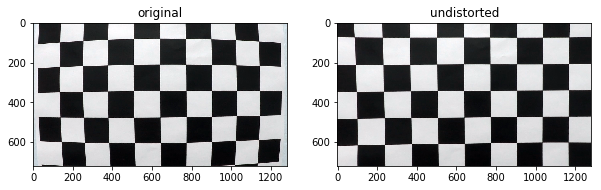

In [26]:
image = cv2.imread(images[0])
undist = cv2.undistort(image, camMat, distCoef)
f, (axe0, axe1) = plt.subplots(1,2, figsize=(10,20))
axe0.imshow(image)
axe0.set_title("original")
axe1.imshow(undist)
axe1.set_title("undistorted")

{'camMat': array([[1.15777818e+03, 0.00000000e+00, 6.67113857e+02],
       [0.00000000e+00, 1.15282217e+03, 3.86124583e+02],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]]),
 'distCoef': array([[-0.24688507, -0.02373156, -0.00109831,  0.00035107, -0.00259866]])}


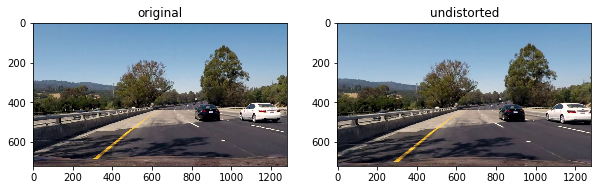

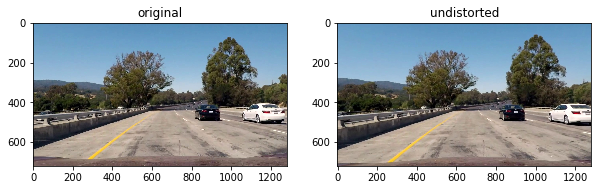

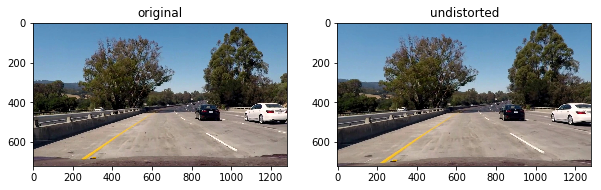

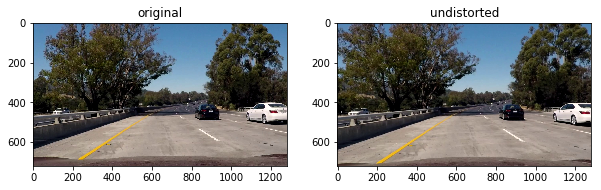

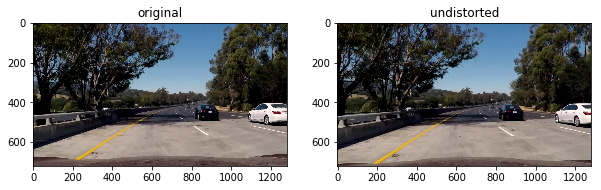

...

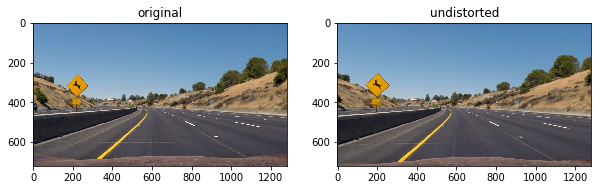

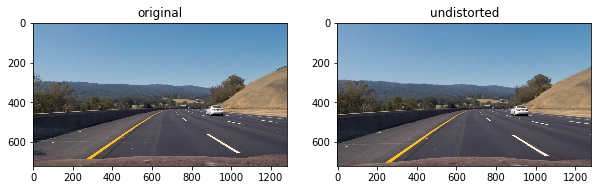

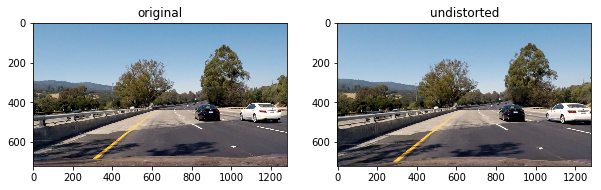

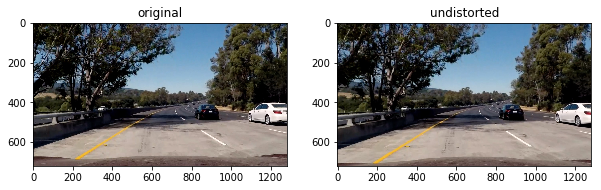

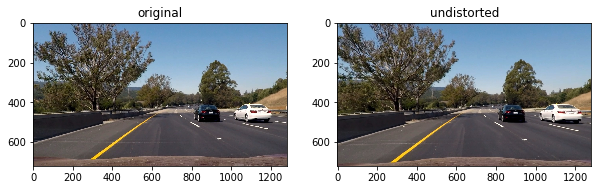

In [28]:
## Undistort test images and save them to "test_images_undist"
import pprint
import pickle
%matplotlib inline
input_dir = "test_images"
output_dir = "test_images_undist"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
test_images = os.listdir(input_dir)

with open("camCalib.pkl", "rb") as file:
    camCalib = pickle.load(file)
pprint.pprint(camCalib)
camMat = camCalib["camMat"]
distCoef = camCalib["distCoef"]
    
for fname in test_images:
    image = cv2.imread(os.path.join(input_dir, fname))
    undist = cv2.undistort(image, camMat, distCoef)
#     cv2.imwrite(os.path.join(output_dir, fname), undist)
    f, (axe0, axe1) = plt.subplots(1,2, figsize=(10,20))
    axe0.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axe0.set_title("original")
    axe1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
    axe1.set_title("undistorted")

### 2. Create thresholded binary images using color and gradient

In [6]:
def abs_sobel_thresh(img, orient ='x', sobel_kernel = 3, thresh = (0,255)):
    """
    Calculate directional gradients and return a binary map due to thresh.

    Args:
        img: input image, either 2-D or 3-D
        orient: 'x'/'y', indicates for calculating 'x'/'y' orient gradient
        sobel_kernel: kernel size for Sobel kernel
        thresh: threshold, gradients within the threshold bounds will be ones.
        
    Returns:
        grad_binary: binary gradient map with the same size of input image.
    """
    min_thresh, max_thresh = thresh[0], thresh[1]
    if len(img.shape) ==3:
        image_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        image_gray = img
    if orient =='x':
        sobel = np.absolute(cv2.Sobel(image_gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    else:
        sobel = np.absolute(cv2.Sobel(image_gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    sobel = np.uint8(255*sobel/np.max(sobel))
    grad_binary = np.zeros_like(sobel)
    grad_binary[(sobel>=min_thresh) & (sobel<=max_thresh)] = 1
    return grad_binary

def mag_thresh(img, sobel_kernel=3, thresh = (0, 255)):
    """
    Calculate gradients magnitude and return a binary map due to thresh.
    
    Args:
        img: input image, either 2-D or 3-D
        sobel_kernel: kernel size for Sobel kernel
        thresh: threshold for gradient magnitude, magnitude within the threshold 
                bounds will be ones.
                
    Returns:
        mag_binary: binary gradient magnitude map with the same size of input image.

    """
    min_thresh, max_thresh = thresh[0], thresh[1]
    if len(img.shape) == 3:
        image_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        image_gray = img
    sobel_x = np.absolute(cv2.Sobel(image_gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    sobel_y = np.absolute(cv2.Sobel(image_gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    sobel_xy = np.sqrt(sobel_x**2 + sobel_y**2)
    sobel_res = np.uint8(255*sobel_xy/np.max(sobel_xy))
    mag_binary = np.zeros_like(sobel_res)
    mag_binary[(sobel_res>=min_thresh) & (sobel_res<=max_thresh)] = 1
    return mag_binary

def dir_thresh(img, sobel_kernel=3, thresh = (0, np.pi/2)):
    """
    Calculate gradients direction and return a binary map due to thresh.
    
    Args:
        img: input image, either 2-D or 3-D
        sobel_kernel: kernel size for Sobel kernel
        thresh: threshold for gradient direction, direction within the threshold 
                bounds will be ones, the default bound will be (0, pi/2)
    
    Returns:
        dir_binary: binary gradient direction map with the same size of input image.
    """
    min_thresh, max_thresh = thresh[0], thresh[1]
    if len(img.shape) == 3:
        image_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        image_gray = img
    sobel_x = np.absolute(cv2.Sobel(image_gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    sobel_y = np.absolute(cv2.Sobel(image_gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    sobel_dir = np.arctan2(sobel_y, sobel_x)
    sobel_res = np.float32(np.pi/2*sobel_dir/np.max(sobel_dir))
    dir_binary = np.zeros_like(sobel_res)
    dir_binary[(sobel_res>=min_thresh) & (sobel_res<=max_thresh)] = 1
    return dir_binary

def select_color(image):
    """
    Mask out yellow and white color in HLS sapce.
    
    Args:
        image: input image in BGR color space.
    
    Returns:
        mask_img: masked image.
    """
    converted = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
    
    white_low_thresh = np.uint8([0, 200, 0])
    white_hi_thresh = np.uint8([255, 255, 255])
    white_mask = cv2.inRange(image, white_low_thresh, white_hi_thresh)
    
    yellow_low_thresh = np.uint8([10, 0, 80])
    yellow_hi_thresh = np.uint8([50, 255, 255])
    yellow_mask = cv2.inRange(image, yellow_low_thresh, yellow_hi_thresh)
    
    mask = cv2.bitwise_or(white_mask, yellow_mask)
    mask_img = cv2.bitwise_and(image, image, mask = mask)
    return mask_img

def threshold_binary(image, ksize, thresh_mag, thresh_dir):
    """
    Select out lane lines using color and gradient selection.
    
    Args:
        image: input raw image(3-D)
        ksize: kernel size of Sobel kernel
        thresh_mag: threshold for gradient magnitude, magnitude within the threshold 
                bounds will be ones.
        thresh_dir: threshold for gradient direction, direction within the threshold 
                bounds will be ones, the default bound will be (0, pi/2)
    
    Returns:
        img_bin: masked binary image.
    """
    img_mask = select_color(image)
    img_gray = cv2.cvtColor(img_mask, cv2.COLOR_BGR2GRAY)
    
    mag_mask = mag_thresh(img_gray, ksize, thresh_mag)
    dir_mask = dir_thresh(img_gray, ksize, thresh_dir)
    img_bin = np.zeros_like(img_gray, dtype=np.uint8)
    img_bin[(mag_mask==1)&(dir_mask==1)] = 255
    return img_bin
    

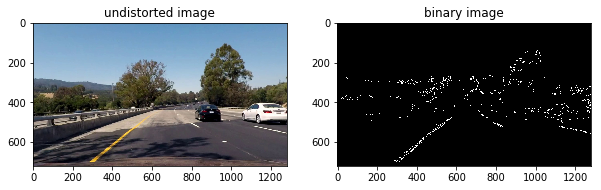

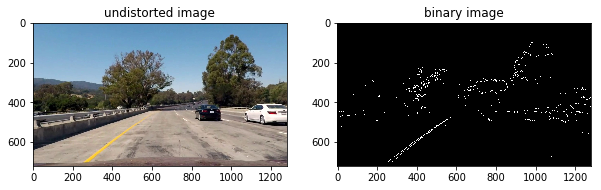

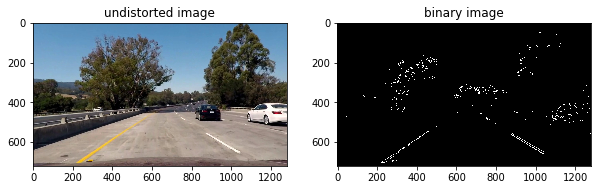

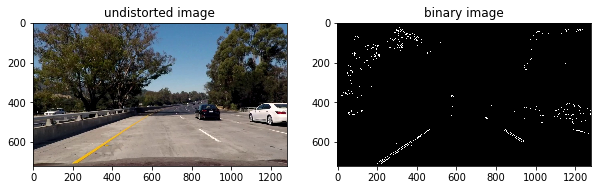

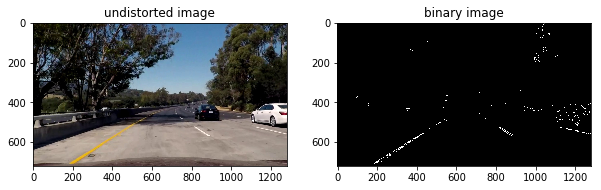

...

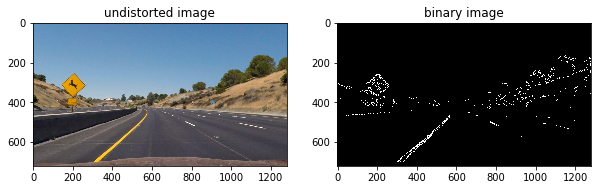

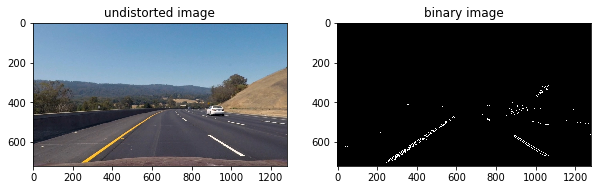

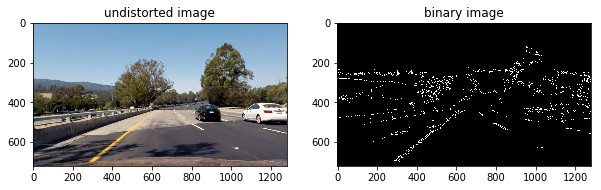

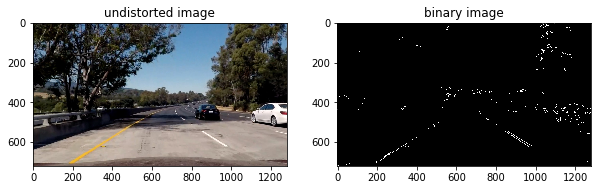

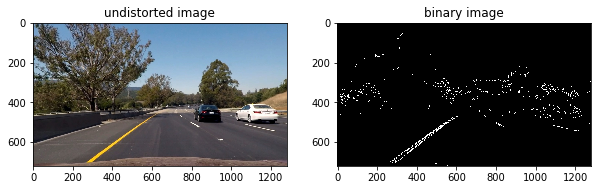

In [29]:
input_dir = "tmp_output/test_images_undist"
output_dir = "tmp_output/test_images_mask"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
test_images = os.listdir(input_dir)
    
for fname in test_images:
    image = cv2.imread(os.path.join(input_dir, fname))
    img_bin = threshold_binary(image, 3, (30,255), (0.7, 1.3))
    cv2.imwrite(os.path.join(output_dir, fname), img_bin)
    
    f, (ax0, ax1) = plt.subplots(1,2, figsize=(10,20))
    ax0.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax0.set_title("undistorted image")
    ax1.imshow(img_bin, cmap="gray")
    ax1.set_title("binary image")

### 3. Apply Perspective Transform

In [8]:
#set source corners and destination corners in `straight_lines1.jpg`
offset = 100
src_corners = np.array([[231, 693],
                       [530, 493],
                       [756, 493],
                       [1084, 693]], dtype=np.float32)

dst_corners = np.array([[340, 693],
                       [340, offset],
                       [940, offset],
                       [940, 693]], dtype=np.float32)

#compute perspective transform matrix and inversed matrix
M = cv2.getPerspectiveTransform(src_corners, dst_corners)
Minv = cv2.getPerspectiveTransform(dst_corners, src_corners)
persMat = {}
persMat["M"] = M
persMat["Minv"] = Minv

# Save persMat to disk
with open("persMat.pkl", "wb") as file:
    pickle.dump(persMat, file)

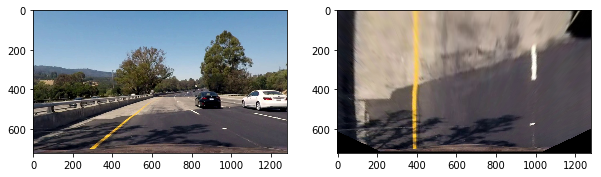

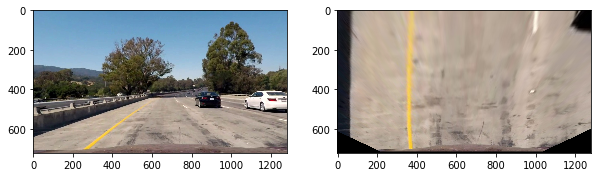

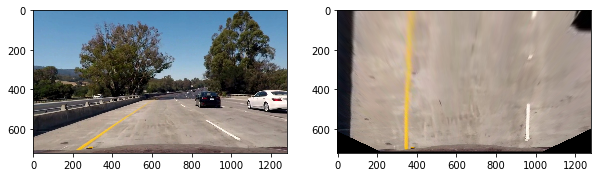

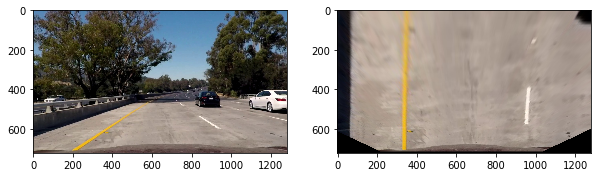

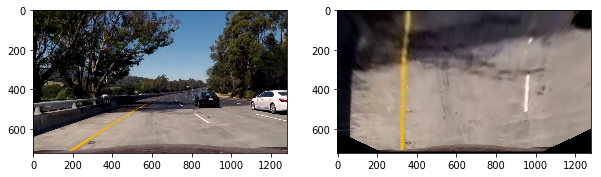

...

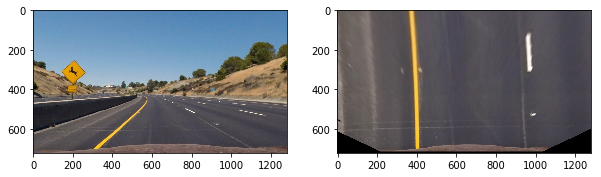

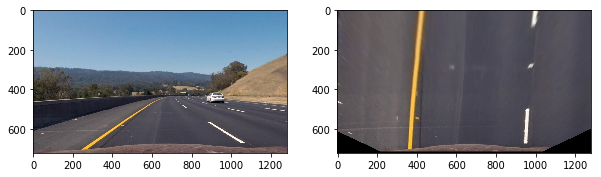

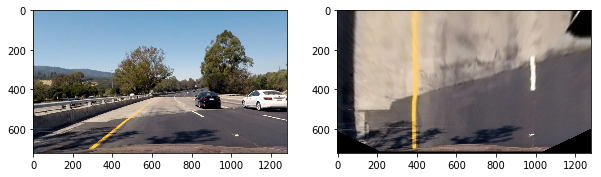

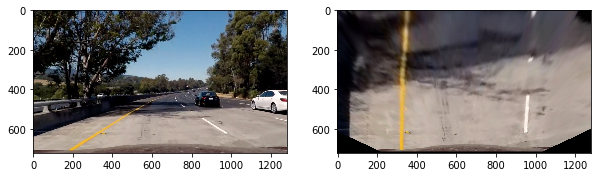

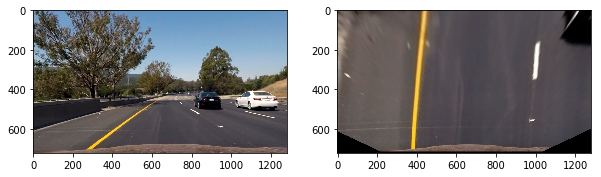

In [9]:
# View Pespective Transform Result
input_dir = "test_images_undist"
output_dir = "test_images_warp"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
test_images = os.listdir(input_dir)

width, height = 1280, 720
for fname in test_images:
    image = cv2.imread(os.path.join(input_dir, fname))
    img_warp = cv2.warpPerspective(image, M, (width, height))
    cv2.imwrite(os.path.join(output_dir, fname), img_warp)
    
    f, (ax0, ax1) = plt.subplots(1,2, figsize=(10,20))
    ax0.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax1.imshow(cv2.cvtColor(img_warp, cv2.COLOR_BGR2RGB))

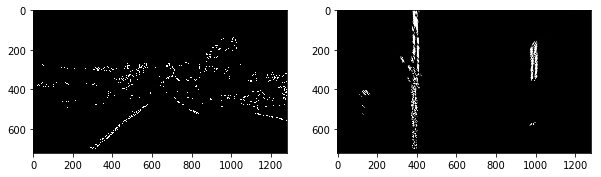

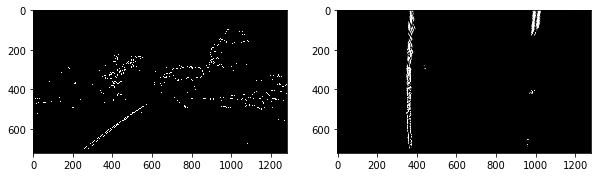

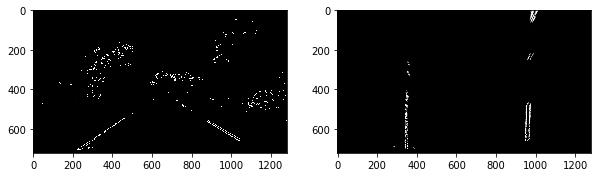

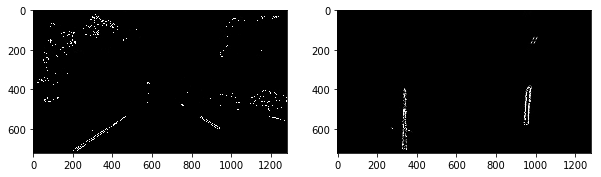

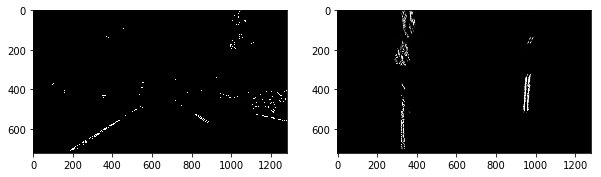

...

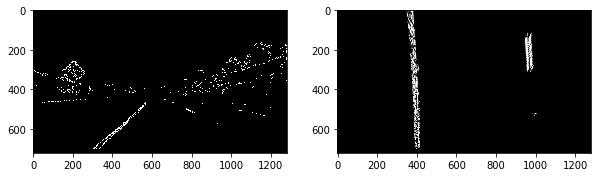

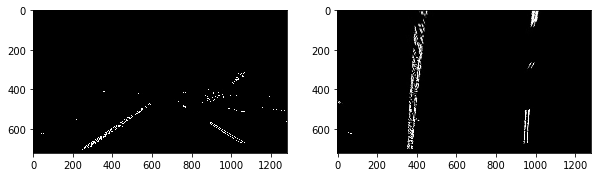

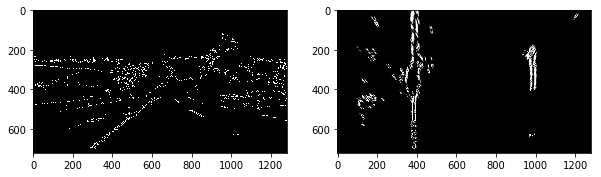

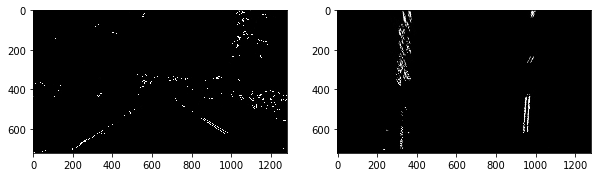

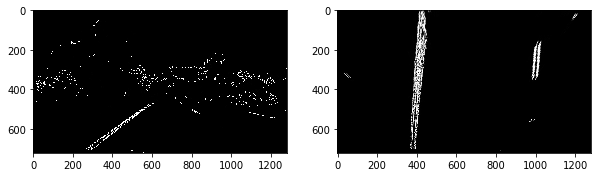

In [10]:
# View Pespective Transform Result of thresholded mask images
input_dir = "test_images_mask"
output_dir = "test_images_warp_mask"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
test_images = os.listdir(input_dir)

width, height = 1280, 720
for fname in test_images:
    image = cv2.imread(os.path.join(input_dir, fname))
    img_warp = cv2.warpPerspective(image, M, (width, height))
    cv2.imwrite(os.path.join(output_dir, fname), img_warp)
    
    f, (ax0, ax1) = plt.subplots(1,2, figsize=(10,20))
    ax0.imshow(image, cmap="gray")
    ax1.imshow(img_warp, cmap="gray")

### 6.Detect lane lines in warped image

In [33]:
def find_window_centroids(image, window_width, window_height, margin):
    """
    Find centroids of left and right lane lines using window convolution.
    
    Args:
        image: gray scale input image(2-D only).
        window_width: width for window mask
        window_height: height for window mask
        margin: searching margin for a new centroid.
        previous_centroid:  left and right previous centroid, in case that 
                            the current window can't find a valid centroid.

    Returns:
        window_centroids: tuple list containing (left_centroid, right_centroid)
    """
    window_centroids = []
    window = np.ones(window_width)
    
    # Get image width and height
    width, height = image.shape[1], image.shape[0]
    # Sum half bottom of image to get slice
    h_low = int(image.shape[0]/2)
    w_mid = int(image.shape[1]/2)
    
    # compute the center of left lane line window
    l_sum = np.sum(image[h_low:, :w_mid], axis=0)
    l_sum_conv = np.convolve(window, l_sum)
    l_center_max = np.max(l_sum_conv)
    l_center = np.argmax(l_sum_conv) - window_width/2
    
    # compute the center of right lane line window
    r_sum = np.sum(image[h_low:,w_mid:], axis=0)
    r_sum_conv = np.convolve(window, r_sum)
    r_center_max = np.max(r_sum_conv)
    r_center = np.argmax(r_sum_conv) - window_width/2 + w_mid
    
    # Make detected centroids valid due to some criteria
    l_center, r_center = get_valid_center(l_center, r_center, l_center_max, r_center_max, window_centroids)
    
    # Add what we found for the first layer
    window_centroids.append((l_center, r_center))
    
    for level in range(1, height//window_height):
        previous_centroid = window_centroids[-1]
        h_low = int(height - (level+1)*window_height)
        h_high = int(height - level*window_height)
        image_layer = np.sum(image[h_low:h_high, :], axis=0)
        conv_signal = np.convolve(window, image_layer)
        
        # Find the best left centroid by using past right centroid as a reference
        offset = window_width/2
        l_min_offset = int(max(l_center+offset-margin, 0))
        l_max_offset = int(min(l_center+offset+margin, width))
        l_center_max = np.max(conv_signal[l_min_offset:l_max_offset])
        l_center = np.argmax(conv_signal[l_min_offset:l_max_offset]) + l_min_offset - offset
        
        # Find the best right centroid by using past right centroid as a reference
        r_min_offset = int(max(r_center+offset-margin, 0))
        r_max_offset = int(min(r_center+offset+margin, width))
        r_center_max = np.max(conv_signal[r_min_offset:r_max_offset])
        r_center = np.argmax(conv_signal[r_min_offset:r_max_offset]) + r_min_offset - offset
        
        #Make detected centroids valid due to some criteria
        l_center, r_center = get_valid_center(l_center, r_center, l_center_max, r_center_max, window_centroids)
        
        window_centroids.append((l_center, r_center))
    return window_centroids

def get_valid_center(l_center, r_center, l_center_max, r_center_max, window_centroids):
    """
    Make detected centroids valid due to some criteria.
    
    Args:
        l_center: detected left centroid.
        r_center: detected right centroid.
        l_center_max: max value of the left window convolution signal.
        r_center_max: max value of the rihgt window convolution signal.
        window_centroids: list of previously detected centroids.
        
    Returns:
        l_center: valid left centroid.
        r_center: valid right centroid.
    """
    if len(window_centroids)>0:
        last_centroids = window_centroids[-1]
    else:
        last_centroids = np.int32([340, 940])
    
    # if not enough line pixels were detected, centers remain the same with 
    # last level centers(the threshold  of the convolution signal is 1000)
    if(l_center_max<1000):
        l_center = int(last_centroids[0])
    if(r_center_max<1000):
        r_center = int(last_centroids[1])
    
    # if the current detected line centroid detour too much from previous detected
    # centroids, modify the detected centroid based on previous detected line's
    # trend.
    if len(window_centroids)>1:
        diff_l_last = window_centroids[-1][0] - window_centroids[-2][0]
        diff_r_last = window_centroids[-1][1] - window_centroids[-2][1]
        
        diff_l_cur = l_center - window_centroids[-1][0]
        diff_r_cur = r_center - window_centroids[-1][1]
        
        if abs(diff_l_cur-diff_l_last)>150:
            l_center = diff_l_last + window_centroids[-1][0]
        if abs(diff_r_cur-diff_r_last)>150:
            r_center = diff_r_last + window_centroids[-1][1]
        
    return l_center, r_center

In [12]:
def find_lane_pixels(binary_warped, window_width, window_height, margin):
    """
    Find lane line pixels.
    
    Args:
        binary_warped: the warped binary image
        window_width: width for window mask
        window_height: height for window mask
        margin: searching margin for a new centroid.
        
    Returns:
        leftx: x coordinates of left lane lines
        lefty: y coordinates of left lane lines
        rightx: x coordinates of right lane lines
        righty: y coordinates of right lane lines
        out_img: warped image with detected windows
        
    """
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    
    # Get window centroids for left and right lane lines
    window_centroids = find_window_centroids(binary_warped, window_width, window_height, margin)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    width, height = binary_warped.shape[1], binary_warped.shape[0]
    # Step through the windows one by one
    if len(window_centroids) > 0:
        for level in range(len(window_centroids)):
            win_y_low = height - (level+1)*window_height
            win_y_high = height - level * window_height
            
            win_xleft_low = int(window_centroids[level][0] - margin)
            win_xleft_high = int(window_centroids[level][0] + margin)
            win_xright_low = int(window_centroids[level][1] - margin)
            win_xright_high = int(window_centroids[level][1] + margin)
            
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low), (win_xleft_high,win_y_high),(0,255,0), 2)
            cv2.rectangle(out_img,(win_xright_low,win_y_low), (win_xright_high,win_y_high),(0,255,0), 2)
            
            good_left_inds = (nonzerox>=win_xleft_low)&(nonzerox<=win_xleft_high) & (nonzeroy>=win_y_low)&(nonzeroy<=win_y_high)
            good_left_inds = [ind for (ind, val) in enumerate(good_left_inds) if val]
            good_right_inds = (nonzerox>=win_xright_low)&(nonzerox<=win_xright_high) & (nonzeroy>=win_y_low)&(nonzeroy<=win_y_high)
            good_right_inds = [ind for (ind, val) in enumerate(good_right_inds) if val]
            
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
        
        left_lane_inds = np.int32(np.concatenate(left_lane_inds))
        right_lane_inds = np.int32(np.concatenate(right_lane_inds))
        
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
    # if no centroids were found
    else:
        print("No centroids were found.")
        leftx, lefty, rightx, righty = [], [], [], []

    return leftx, lefty, rightx, righty, out_img

def fit_polynomial(binary_warped,window_width, window_height, margin, last_points):
    """
    Fit the detected lane line pixels with quadratic curves.
    
    Args:
        binary_warped: the warped binary image
        window_width: width for window mask
        window_height: height for window mask
        margin: searching margin for a new centroid.
        last_points: a list of latest detected line points, i.e. [last_leftx, last_lefty, last_rightx, last_righty]
    
    Returns:
        out_img: output image with colored lane lines
        left_fitx: x coordinates of fitted left line
        right_fitx: x coordinates of fitted right line
        ploty: y coordinates of lane lines
        ave_curv_real: computed average real curvature of lane lines
        detour_real: computed length of detour from lane center
        last_points: a list of latest detected line points, i.e. [last_leftx, last_lefty, last_rightx, last_righty]
    """
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped, window_width, window_height, margin)
    
    ym_per_pix = 30/720   # meters per pixel in y dimension
    xm_per_pix = 3.7/600  # meters per pixel in x dimension
    left_fit, right_fit, ave_curv_real, detour_real, last_points = compute_real(leftx, lefty, rightx, righty, ym_per_pix, xm_per_pix, last_points)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    return out_img, left_fitx, right_fitx, ploty, ave_curv_real, detour_real, last_points

def compute_real(leftx, lefty, rightx, righty, ym_per_pix, xm_per_pix, last_points):
    '''
    Compute the real curvature of lane lines in meters and the length of detour from lane center.
    
    Args:
        leftx: x coordinates of detected left lane line points
        lefty: y coordinates of detected left lane line points
        rightx: x coordinates of detected right lane line points
        righty: y coordinates of detected right lane line points
        ym_per_pix: meters per pixel in y dimension
        xm_per_pix: meters per pixel in x dimension
        last_points: a list of latest detected line points, i.e. [last_leftx, last_lefty, last_rightx, last_righty]
    
    Returns:
        left_fit: fitted polynominal parameters of left lane line
        right_fit: fitted polynominal parameters of right lane line
        ave_curverad: average real curvarture in meters of lane lines
        detour_real: computed length of detour from lane center
        last_points: a list of latest detected line points, i.e. [last_leftx, last_lefty, last_rightx, last_righty]
        
    '''
    
    if(len(last_points)==4):
        last_leftx, last_lefty, last_rightx, last_righty = last_points[0], last_points[1], last_points[2], last_points[3]
    
    leftx_cr = leftx * xm_per_pix
    lefty_cr = lefty * ym_per_pix
    rightx_cr = rightx * xm_per_pix
    righty_cr = righty * ym_per_pix
    
    left_fit_cr = np.polyfit(lefty_cr, leftx_cr, 2)
    right_fit_cr = np.polyfit(righty_cr, rightx_cr, 2)
    
    ploty = np.linspace(0,719, num=720)
    ploty_cr = ploty * ym_per_pix
    
    y_eval = np.max(ploty_cr)
    
    left_curverad = (1+(2*left_fit_cr[0]*y_eval+left_fit_cr[1])**2)**(3/2)/np.abs(2*left_fit_cr[0])
    right_curverad = (1+(2*right_fit_cr[0]*y_eval+right_fit_cr[1])**2)**(3/2)/np.abs(2*right_fit_cr[0]) 
    ave_curverad = (left_curverad*len(leftx)+right_curverad*len(rightx)) / (len(leftx)+len(rightx))
    
    if (len(last_points)==4) & (((left_curverad/right_curverad) > 10) | ((right_curverad/left_curverad) > 10)):
        leftx, lefty, rightx, righty = last_leftx, last_lefty, last_rightx, last_righty
    else:
        last_points = [leftx, lefty, rightx, righty]
    
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    y_eval_pix = np.max(ploty)
    lx_eval_pix = left_fit[0]*y_eval_pix**2 + left_fit[1]*y_eval_pix + left_fit[2]
    rx_eval_pix = right_fit[0]*y_eval_pix**2 + right_fit[1]*y_eval_pix + right_fit[2]
    lr_center = (lx_eval_pix+rx_eval_pix)/2
    detour_real = abs(lr_center - 640)*xm_per_pix
    
    return left_fit, right_fit, ave_curverad, detour_real, last_points

In [14]:
# with open("camCalib.pkl", "rb") as file:
#     camCalib = pickle.load(file)
# pprint.pprint(camCalib)
# camMat = camCalib["camMat"]
# distCoef = camCalib["distCoef"]

def detecting_pipeline(image, last_points, camCalib = camCalib, persMat = persMat, 
                       window_width = 50, window_height = 90, 
                       margin = 100):
    """
    The overall lane detection pipeline.
    
    Args:
        image: input image (3-D)
        last_points: a list of latest detected line points, i.e. [last_leftx, last_lefty, last_rightx, last_righty]
        camCalib: a dictionary with camera calibration parameters(keys are "camMat" and "distCoef")
        persMat: a dictionary with perspective matrix (keys are "M" and "Minv")
        window_width: width for window mask
        window_height: height for window mask
        margin: searching margin for a new centroid.
    
    Returns:
        img_lane_mask: output image with detected lane lines, computed curvature and detour meters.
        last_points: a list of latest detected line points, i.e. [last_leftx, last_lefty, last_rightx, last_righty]
    """
    # get camera calibration parameters
    camMat = camCalib["camMat"]
    distCoef = camCalib["distCoef"]
    # get perspective transform matrix
    M = persMat["M"]
    Minv = persMat["Minv"]
    
    # undistort images
    img_undist = cv2.undistort(image, camMat, distCoef)
    # make the input 3-D image to 2-D binary image
    img_bin = threshold_binary(img_undist, 3, (30,255), (0.7, 1.3))
    
    width, height = img_bin.shape[1], img_bin.shape[0]
    # apply perspectvie transform to binary image
    binary_warped = cv2.warpPerspective(img_bin, M, (width, height))
    
    # compute curvatures and detour length in meters, get the fitted polynominal parameters of left and right lane lines.
    out_img, left_fitx, right_fitx, ploty, ave_curv_real, \
    detour_real, last_points = fit_polynomial(binary_warped,window_width, window_height, margin, last_points)
    
    # draw the final results
    left_p = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    right_p = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    points = np.hstack((left_p, right_p))
    mask_img = np.zeros_like(out_img)
    cv2.fillPoly(mask_img, np.array(points, dtype=np.int32), [0,255,0])
    orig_mask_img = cv2.warpPerspective(mask_img, Minv, (width, height))
    img_lane_mask = cv2.addWeighted(orig_mask_img, 0.4, image, 1.0, 0)
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    text0 = "curvature: %.2fm"%ave_curv_real
    text1 = "detour from center: %.2fm"%detour_real
    cv2.putText(img_lane_mask, text0, (50, 50), font, 1.5, (255, 255, 0), 2)
    cv2.putText(img_lane_mask, text1, (50, 100), font, 1.5, (255, 255, 0), 2)
    
    return img_lane_mask, last_points

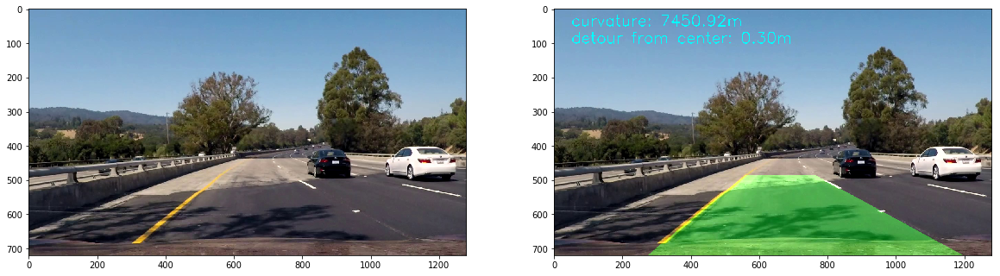

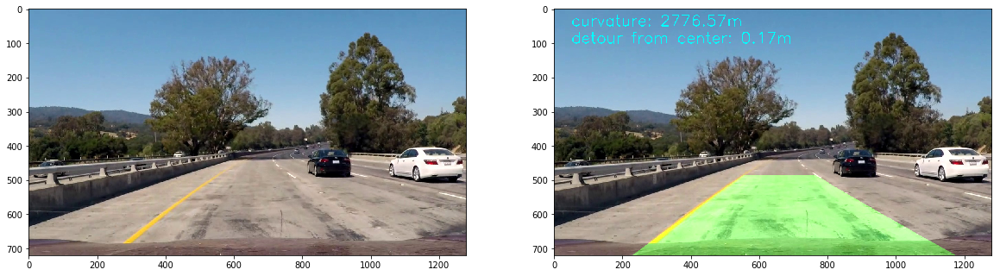

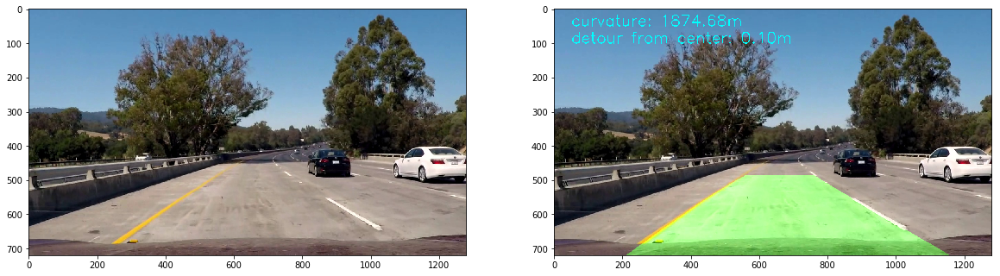

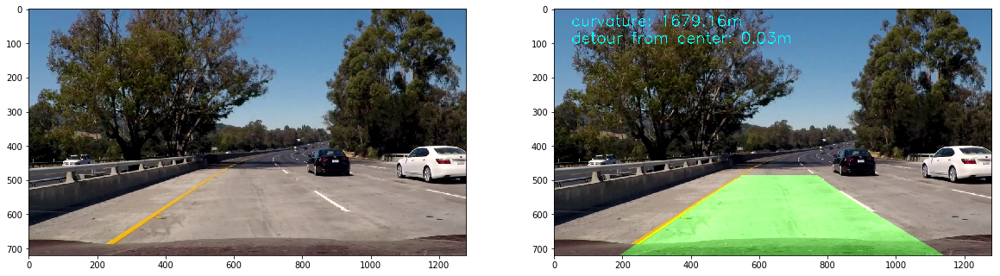

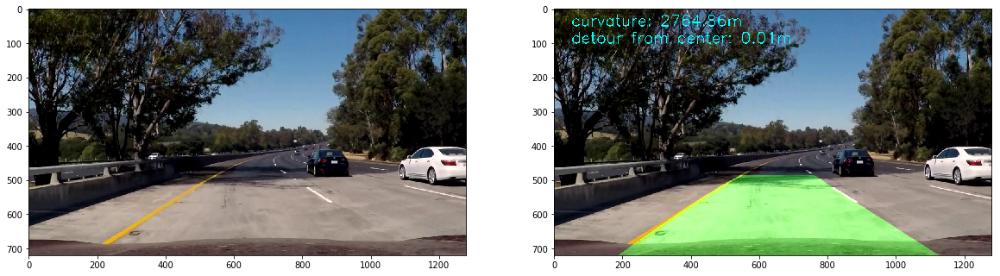

...

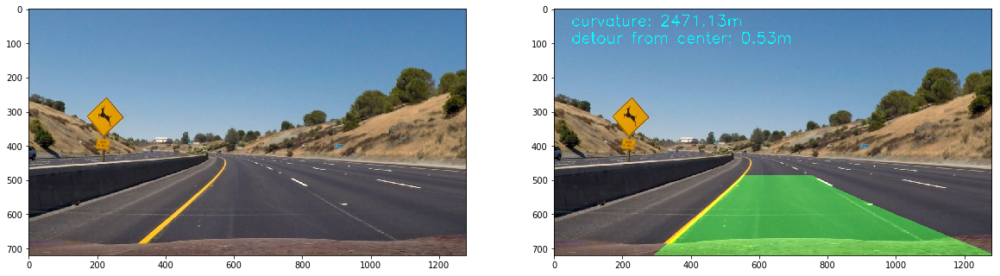

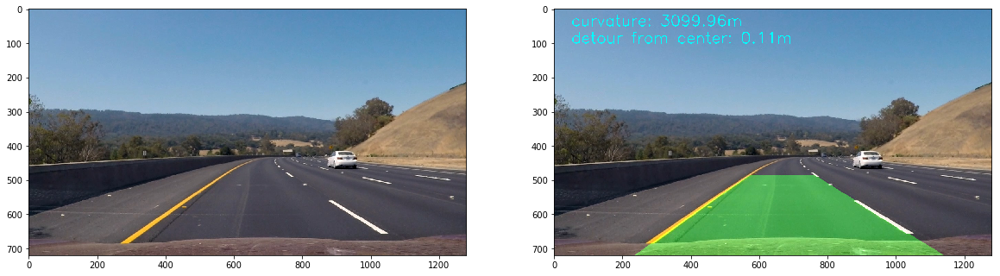

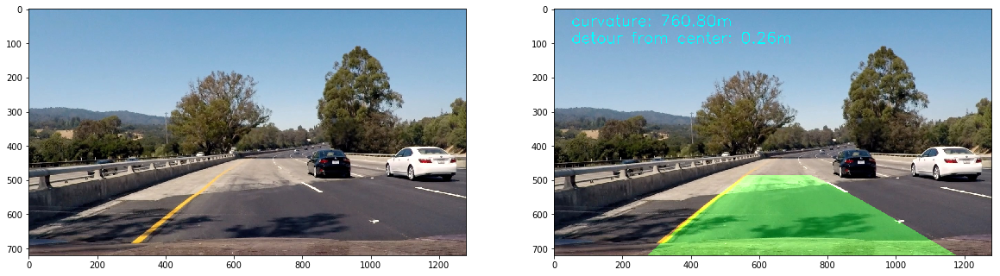

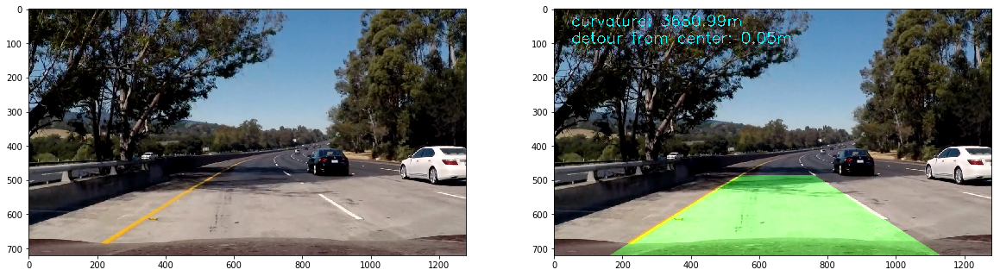

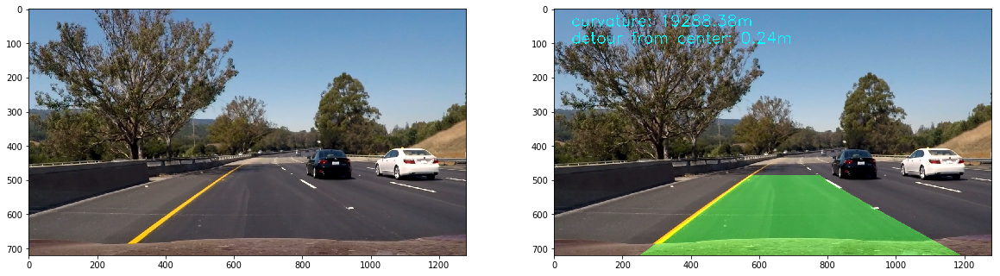

In [35]:
input_dir = "test_images"
output_dir = "test_images_output"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
images = os.listdir(input_dir)
window_width = 50
window_height = height//8
margin = 100
last_points = []

for fname in images:
    image = cv2.imread(os.path.join(input_dir, fname))
    img_res, _ = detecting_pipeline(image, last_points, camCalib, persMat, window_width, window_height, margin)
    cv2.imwrite(os.path.join(output_dir, fname), img_res)
    
    f, (ax0, ax1) = plt.subplots(1, 2, figsize = (20, 10))
    ax0.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax1.imshow(cv2.cvtColor(img_res, cv2.COLOR_BGR2RGB))
    plt.show()

## Process video streams

In [25]:
video_name = "project_video.mp4"
video = cv2.VideoCapture(video_name)
fourcc = cv2.VideoWriter_fourcc(*'XVID')
fps = video.get(cv2.CAP_PROP_FPS)
size = (int(video.get(cv2.CAP_PROP_FRAME_WIDTH)), 
        int(video.get(cv2.CAP_PROP_FRAME_HEIGHT)))
i = 0

window_width = 50
window_height = height//8
margin = 100
last_points = []

video_dir = "challenge_res.mp4"
video_writer = cv2.VideoWriter(video_dir, fourcc, fps, size)

while(video.isOpened()):
    ret, frame = video.read()
    if ret==True:
        frame_res, last_points = detecting_pipeline(frame, last_points, camCalib, persMat, window_width, window_height, margin)
#         cv2.imwrite(os.path.join(output_dir, '%05d.jpg'%i), frame)
        video_writer.write(frame_res)
        cv2.imshow('rr', frame_res)
        cv2.waitKey(1)
#         if cv2.waitKey(1) & 0xFF == ord('q'):
#             break
    else:
        break
    i = i+1
video.release()
video_writer.release()
cv2.destroyAllWindows()